# TKO Tumors

In [1]:
# import mazebox as mb
import scvelo as scv
import scanpy as sc
import os.path as op
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import sys
import dropkick as dk
# make sure to use position 1
sys.path.insert(1, "/Users/smgroves/Documents/GitHub/Groves-CellSys2021/")
import mazebox as mb
import cellrank as cr
import scanorama

In [2]:
adata = cr.read('../../out/TKO-tumors/adata_02.h5ad')


/Users/smgroves/Documents/anaconda3/envs/mazebox_env/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `cellrank.tl.read` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  """Entry point for launching an IPython kernel.


In [45]:
X_magic = cr.read('../../out/TKO-tumors/X_magic_02.h5ad')
X_magic

/Users/smgroves/Documents/anaconda3/envs/mazebox_env/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `cellrank.tl.read` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  """Entry point for launching an IPython kernel.


AnnData object with n_obs × n_vars = 2310 × 12751
    obs: 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'tumor', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ambient', 'log1p_total_counts_ambient', 'pct_counts_ambient', 'arcsinh_total_counts', 'S_score', 'G2M_score', 'phase', 'M', 'E', 'clusters_gradients', 'cell_cycle_diff'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'dropkick_coef-TKO1', 'dropkick_coef-TKO2', 'dropkick_coef-TKO3', 'mito', 'pct_dropout_by_counts', 'ambient', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std', 'n_cells'
    uns: 'pca', 'tumor_colors'
    obsm: 'X_pca'
    varm: 'PCs'

In [4]:
adata.layers['imputed'] = X_magic.X
adata.obsm['X_pca_imputed'] = X_magic.obsm['X_pca']

In [5]:
adata.write_h5ad('../../out/TKO-tumors/adata_03.h5ad')

# Subtyping with Archetype Signatures

In [6]:
adata = cr.read('../../out/TKO-tumors/adata_03.h5ad')

/Users/smgroves/Documents/anaconda3/envs/mazebox_env/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `cellrank.tl.read` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  """Entry point for launching an IPython kernel.


## Using Mazebox to generate archetype scores

In [10]:
sig_matrix = pd.read_csv('../../out/bulk/sig_matrix_ParTI_2021.csv', header =0, index_col = 0)

sig_matrix = sig_matrix / np.linalg.norm(sig_matrix, axis=0)
sig_matrix.index = [i.capitalize() for i in sig_matrix.index]

In [11]:
# import seaborn as sns
# max_subtype = []
# max_v = []
# sig_matrix_copy = sig_matrix.copy()
# for i,r in sig_matrix.iterrows():
#     maxi = r.idxmax()
#     maxv = r.max()
#     max_subtype.append(maxi) 
#     max_v.append(maxv)
# sig_matrix_copy['max_subtype'] = max_subtype
# sig_matrix_copy['max'] = max_v

# plt.figure(figsize=(5,30))
# sig_matrix_copy = sig_matrix_copy.sort_values(by = ['max_subtype','max'], ascending=[True, False])
# sig_matrix_copy = sig_matrix_copy[['SCLC-A','SCLC-A2','SCLC-N','SCLC-P','SCLC-Y']]
# sns.heatmap(sig_matrix_copy, cmap='viridis', yticklabels = True)
# plt.xticks(rotation = 90)
# plt.title(f'Log-transformed Archetype Expression Profiles')
# plt.tight_layout()
# # plt.savefig(op.join(outdir,f'figures/Archetypes/sig_matrix_logfc.pdf'))
# plt.show()
# plt.close()

# sig_matrix_copy.to_csv('../data/sig_matrix_ParTI.csv')

If the below code gives an error about data shape, use `type = 'csr'`.

Cells with zero expression for all genes in gene signature will get scores of NaN when assigning scores in adata.obs (because these cells are filtered for the calculation). 

Trying to set attribute `.obs` of view, copying.


Transforming tumor data...
Gene signature matrix now has shape:  (65, 5)
Tumor data shortened to genes in gene list...
(2269, 65)
Tumor data subsetting complete.


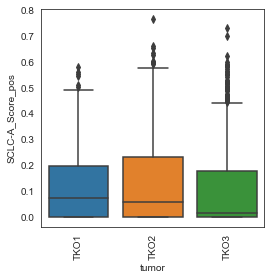

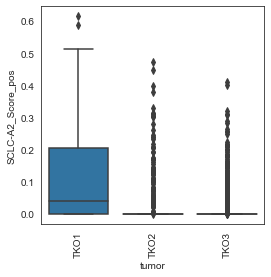

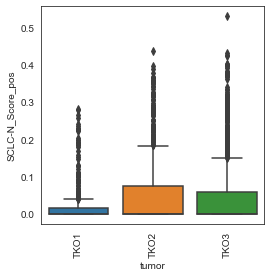

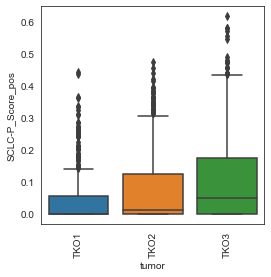

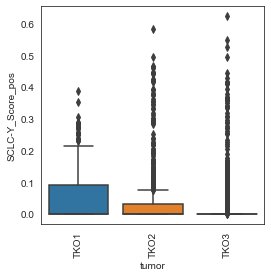

In [12]:
adata, adata_small, sig_matrix2 = mb.ar.phenotyping_recipe(adata, sig_matrix, groupby = 'tumor',velocity=False)


In [13]:
from sklearn.manifold import LocallyLinearEmbedding
def _archetype_diagram_no_arrows(_adata, score_name, color, figsize, order, multiplier,fname,
                                 sizes = None, alpha = .3, s = 30, color_dict = None, norm = 'scale'):
    # X = subtype scores for each subtype (pd dataframe)
    n_samples = len(_adata.obs_names)

    n_types = len(sig_matrix.columns)
    subtypes = sig_matrix.columns
    X = _adata.obs[[f"{x}{score_name}" for x in subtypes]]
    top = X.sum().sort_values(ascending=False)[:3]  # return a list of n largest element
    print(top.index)

    # normalize X to sum to 1 (makes sure that the data fits within the archetype diagram with I matrix = vertices
    X_norm = pd.DataFrame(columns=X.columns)
    if norm == 'scale':
        for i, r in X.iterrows():
            if r.sum() == 0:
                X_norm = X_norm.append(r)
            else:
                X_norm = X_norm.append(r / r.sum())
    elif norm == 'max':
        max = X.max().max()
        X_norm = X / max
    elif norm == 'None':
        X_norm = X

    X = X_norm.fillna(0)
    if type(order) != type(None):
        X = X[[f"{x}{score_name}" for x in order]]
        subtypes = order
    else:
        order = subtypes

    ident = np.identity(n_types)
    for i, x in enumerate(subtypes):
        X = X.append(pd.DataFrame(np.array(ident[i]), index=X.columns, columns=[x]).T)

    embedding = LocallyLinearEmbedding(n_components=2, n_neighbors=4, method='modified', eigen_solver='dense')
    X_transformed = embedding.fit_transform(X[-n_types:])
    X_transformed = X_transformed.T

    X_df_data = embedding.transform(X[:-n_types])
    X_df_data = X_df_data.T

    fig = plt.figure(figsize=figsize)

    ax = fig.add_subplot()
    colors = _adata.obs[color].values
    if type(colors[0]) == str:
        c = [color_dict[i] for i in colors]
    else:
        c = colors
    plt.scatter(X_df_data[0], X_df_data[1], c=c, zorder=1, alpha=alpha, s=s)
    if type(sizes) == int:
        plt.scatter(X_transformed[0, -n_types:], X_transformed[1, -n_types:], c='black',
                    zorder=2, s=sizes)
    else:
        sizes = [Counter(colors)[i] * multiplier / n_samples for i in order]
        print(sizes)
        plt.scatter(X_transformed[0, -n_types:], X_transformed[1, -n_types:], c='black',
                zorder=2, s=sizes)
    plt.axis('tight')
    plt.savefig(f'./figures/{fname}.pdf')
    plt.show()
    plt.close()
    fig = plt.figure(figsize=figsize)

    ax = fig.add_subplot()
    colors = _adata.obs[color].values
    if type(colors[0]) == str:
        c = [color_dict[i] for i in colors]
    else:
        c = colors
    sns.kdeplot(X_df_data[0], X_df_data[1], cmap="Reds", shade=True, bw=.15)
    if type(sizes) == int:
        plt.scatter(X_transformed[0, -n_types:], X_transformed[1, -n_types:], c='black',
                    zorder=2, s=sizes)
    else:
        sizes = [Counter(colors)[i] * multiplier / n_samples for i in order]
        print(sizes)
        plt.scatter(X_transformed[0, -n_types:], X_transformed[1, -n_types:], c='black',
                    zorder=2, s=sizes)
    plt.axis('tight')
    plt.show()
    plt.close()


Index(['SCLC-A_Score', 'SCLC-P_Score', 'SCLC-N_Score'], dtype='object')


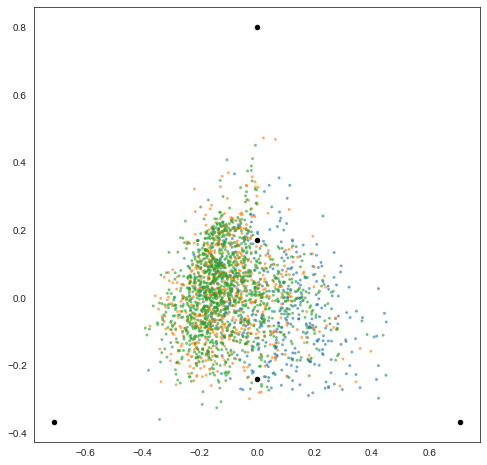

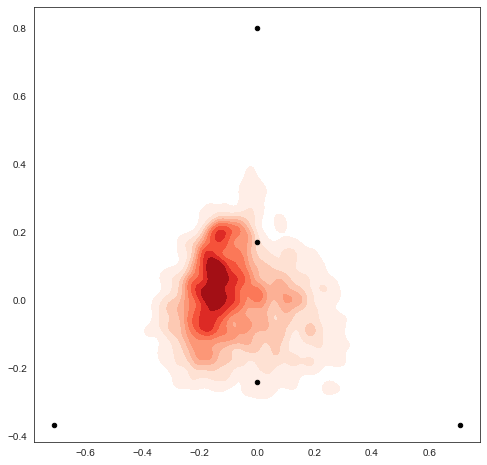

In [15]:
color_dict = {}
for i,c in enumerate(sorted(list(set(adata_small.obs['tumor'])))):
    if i == 7:     color_dict[c] = sns.color_palette('tab10')[9] #skip grey
    else:
        color_dict[c] = sns.color_palette('tab10',8)[i]
cmap = 'jet'
_archetype_diagram_no_arrows(adata_small, color_dict=color_dict,color='tumor',fname = 'tumor_archetype_space',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',
                        multiplier=1, figsize=(8,8), score_name = '_Score', alpha = .5, s = 4, sizes = 20)


## Newer phenotype classification with labeled generalists
Let's check to see how many samples have significant scores (p>.3) for more than one phenotype.

<BarContainer object of 3 artists>

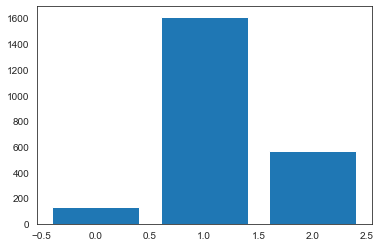

In [16]:
df = adata.obs[[f"{x}_Score_pos" for x in ['SCLC-N', 'SCLC-A', 'SCLC-P', 'SCLC-Y', 'SCLC-A2']]]
# np.unique((df > .3).sum(axis = 1), return_counts=True)[1]
plt.bar(height = np.unique(((df.T/df.sum(axis = 1)).T > .33).sum(axis = 1), return_counts=True)[1], x = range(3), log=False)

In [17]:
arc_pheno = []
arc_aa_type = []

for i,r in df.iterrows():
    r = r/r.sum()
    if (r > .33).sum() > 1:
        arc_aa_type.append('Generalist')
        arc_pheno.append(r.sort_values(ascending=False)[0:2].sort_index().index[0].split('_')[0]+"_"+r.sort_values(ascending=False)[0:2].sort_index().index[1].split('_')[0])
    elif  (r > .33).sum() == 1:
        try:
            arc_aa_type.append(r.idxmax().split('_')[0]+" Specialist")
            arc_pheno.append(r.idxmax().split('_')[0])
        except AttributeError: 
            arc_aa_type.append("Unclassified")
            arc_pheno.append("Unclassified")
    else: 
        arc_aa_type.append("Unclassified")
        arc_pheno.append("Unclassified")
adata.obs['arc_pheno'] = arc_pheno
adata.obs['arc_aa_type'] = arc_aa_type


In [18]:
pd.crosstab(adata.obs['arc_pheno'],adata.obs['tumor']).style.background_gradient(cmap='viridis')

tumor,TKO1,TKO2,TKO3
arc_pheno,,,
SCLC-A,94,211,328
SCLC-A2,98,25,47
SCLC-A2_SCLC-A,20,3,6
SCLC-A2_SCLC-N,10,9,8
SCLC-A2_SCLC-P,8,3,15
SCLC-A2_SCLC-Y,13,3,10
SCLC-A_SCLC-N,1,15,25
SCLC-A_SCLC-P,15,38,87
SCLC-A_SCLC-Y,27,46,54


In [19]:
pd.crosstab( adata.obs['arc_pheno'],adata.obs['Phenotype']).style.background_gradient(cmap='viridis')

Phenotype,Generalist,None,SCLC-A,SCLC-A2,SCLC-N,SCLC-P,SCLC-Y
arc_pheno,,,,,,,
SCLC-A,533,54,46,0,0,0,0
SCLC-A2,140,24,0,6,0,0,0
SCLC-A2_SCLC-A,27,2,0,0,0,0,0
SCLC-A2_SCLC-N,26,1,0,0,0,0,0
SCLC-A2_SCLC-P,24,2,0,0,0,0,0
SCLC-A2_SCLC-Y,20,6,0,0,0,0,0
SCLC-A_SCLC-N,31,10,0,0,0,0,0
SCLC-A_SCLC-P,130,10,0,0,0,0,0
SCLC-A_SCLC-Y,108,13,3,0,0,0,3


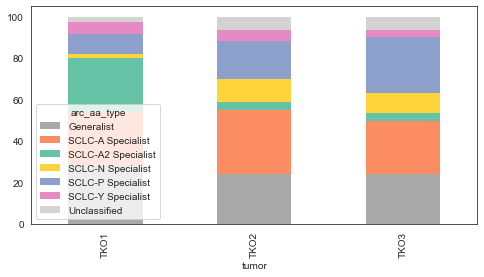

In [20]:
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y Specialist': cp[4], 'SCLC-A Specialist': cp[0], 'SCLC-A2 Specialist': cp[1], 'SCLC-N Specialist': cp[2], 'SCLC-P Specialist': cp[3],
              'Generalist': 'darkgrey', 'Unclassified': 'lightgrey'}
mb.pl.subtype_bar(adata,groupby='tumor', fname = 'tumor', pheno_name="arc_aa_type", custom_palette=color_dict)

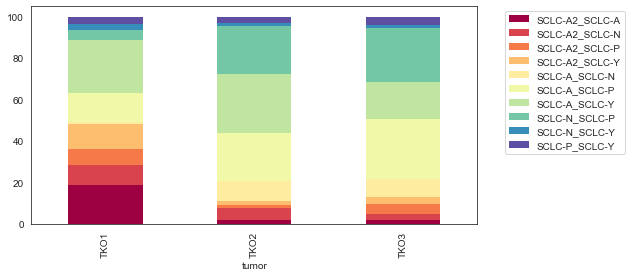

In [21]:
_adata = adata[adata.obs['arc_aa_type'] == 'Generalist']
plt.rcParams["figure.figsize"] = [8, 4]
((pd.crosstab(_adata.obs["tumor"], _adata.obs['arc_pheno']).T /
  pd.crosstab(_adata.obs["tumor"], _adata.obs['arc_pheno']).sum(axis=1)) * 100).T.plot(kind='bar',
                                                                                              stacked=True,
                                                                                              linewidth=0, cmap = 'Spectral')
plt.legend(bbox_to_anchor=(1.05, 1))

plt.savefig('./figures/arc_aa_generalist_subtypes.pdf')

In [22]:
# import matplotlib as mpl
# mpl.rcParams['figure.dpi']= 300
# mb.pl.archetype_diagrams(adata, sig_matrix, color_dict=color_dict, groupby='cline',color = 'arc_aa_type',
#                         order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',sizes = 20,
#                         figsize=(4,4), score_name = '_Score', alpha = .8, s = 8, arrows = False)


In [23]:
np.unique(adata.obs['arc_pheno'], return_counts=True)

(array(['SCLC-A', 'SCLC-A2', 'SCLC-A2_SCLC-A', 'SCLC-A2_SCLC-N',
        'SCLC-A2_SCLC-P', 'SCLC-A2_SCLC-Y', 'SCLC-A_SCLC-N',
        'SCLC-A_SCLC-P', 'SCLC-A_SCLC-Y', 'SCLC-N', 'SCLC-N_SCLC-P',
        'SCLC-N_SCLC-Y', 'SCLC-P', 'SCLC-P_SCLC-Y', 'SCLC-Y',
        'Unclassified'], dtype=object),
 array([633, 170,  29,  27,  26,  26,  41, 140, 127, 206, 120,  10, 498,
         21, 104, 132]))

In [24]:
adata.write_h5ad('../../out/TKO-tumors/adata_03.h5ad')



... storing 'Phenotype' as categorical
... storing 'arc_pheno' as categorical
... storing 'arc_aa_type' as categorical


Keep in mind that the ternary plots are renormalized, so the cell labeled A2, for example, shows up in the middle of the plot because A, N, and Y are renormalized to sum to 1 even though A2 was the highest probability phenotype.

# ParetoTI S Matrix
1. ParetoTI: fit_pch gives an S matrix for each archetype. Take a look at these values. Maybe try a Gaussian model on these values?
2. We could also do a test where we see if each bulk archetype is enriched for S values for each archetype, and if significant, align the archetypes that way. 
3. Try doing a CAP plot for the S matrix and for the GMM-transformed S matrix


In [47]:
adata = sc.read_h5ad('../../out/TKO-tumors/adata_03.h5ad')


In [48]:
S_matrix = pd.read_csv('../../out/TKO-tumors/ParetoTI/S.csv', index_col=0).T

In [49]:
S_matrix

,1,2,3,4
TK01:AAAGCCTGGGAGCAx-TKO1,0.124858,0.050349,0.222626,0.602166
TK01:AAATCCCTCCTCCAx-TKO1,0.272618,0.090006,0.196979,0.440397
TK01:AAACCGTGATTCCTx-TKO1,0.047225,0.114827,0.000000,0.837948
TK01:AAATCATGTGGAAAx-TKO1,0.126304,0.000000,0.131236,0.742459
TK01:AACTCGGATCAGACx-TKO1,0.015072,0.000000,0.009696,0.975231
...,...,...,...,...
TKO3_met_from_TKO2:TTCGGAGACGAACTx-TKO3,0.047314,0.946708,0.000000,0.005979
TKO3_met_from_TKO2:TTGAGGTGGTTTCTx-TKO3,0.738327,0.261673,0.000000,0.000000
TKO3_met_from_TKO2:TTCATTCTCAGCTAx-TKO3,0.795990,0.000000,0.000000,0.204010
TKO3_met_from_TKO2:TTGAATGAGCAGTTx-TKO3,0.170453,0.829547,0.000000,0.000000


[<AxesSubplot:xlabel='pca_imputed1', ylabel='pca_imputed2'>,
 <AxesSubplot:xlabel='pca_imputed1', ylabel='pca_imputed2'>,
 <AxesSubplot:xlabel='pca_imputed1', ylabel='pca_imputed2'>,
 <AxesSubplot:xlabel='pca_imputed1', ylabel='pca_imputed2'>]

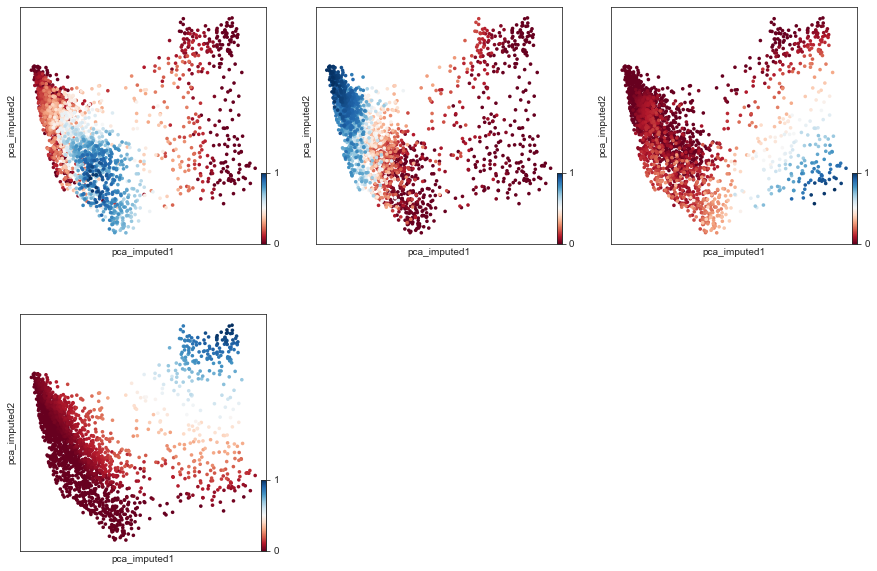

In [50]:
scv.pl.scatter(adata, c = [S_matrix[i] for i in [1,2,3,4]], basis = 'pca_imputed',components='1,2', show=False, figsize= (5,5),ncols = 3, frameon=True, cmap = 'RdBu')


[<AxesSubplot:xlabel='PC1', ylabel='PC2'>,
 <AxesSubplot:xlabel='PC1', ylabel='PC2'>,
 <AxesSubplot:xlabel='PC1', ylabel='PC2'>,
 <AxesSubplot:xlabel='PC1', ylabel='PC2'>]

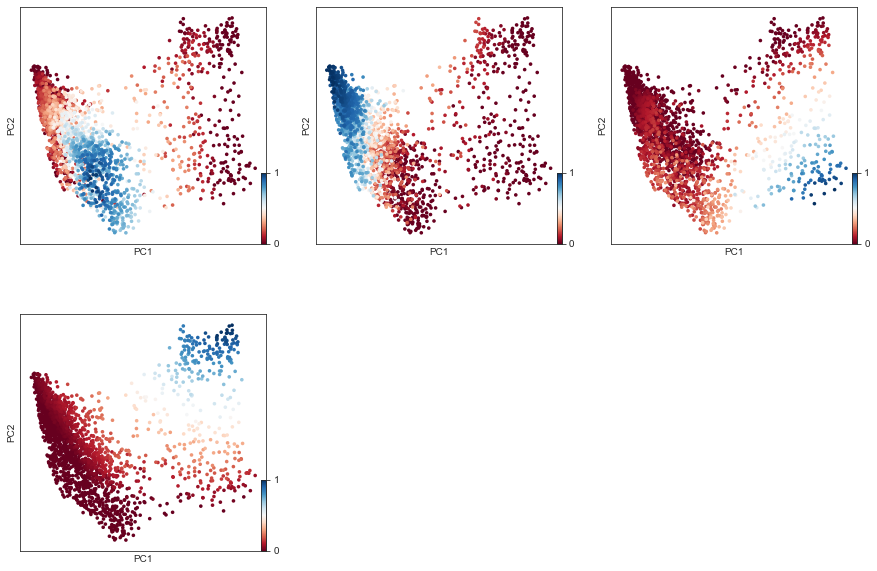

In [51]:
scv.pl.scatter(X_magic, c = [S_matrix[i] for i in [1,2,3,4]], basis = 'pca',components='1,2', show=False, figsize= (5,5),ncols = 3, frameon=True, cmap = 'RdBu')


In [52]:
sc.pp.neighbors(X_magic)
scv.tl.umap(X_magic)

In [53]:
X_magic.obsm['ParetoTI_S'] = S_matrix

In [54]:
tmp = X_magic.obsm['ParetoTI_S'].copy()

for arc in  X_magic.obsm['ParetoTI_S'].columns:
    closest = X_magic.obsm['ParetoTI_S'].loc[X_magic.obsm['ParetoTI_S'][arc].sort_values(ascending = False) > .8]
    tmp.loc[closest.index,'specialist'] = str(arc)
X_magic.obs['specialists_ParetoTI_S'] = tmp.specialist
X_magic.obs['specialists_ParetoTI_S'].value_counts()

2    501
1    229
4    106
3     45
Name: specialists_ParetoTI_S, dtype: int64

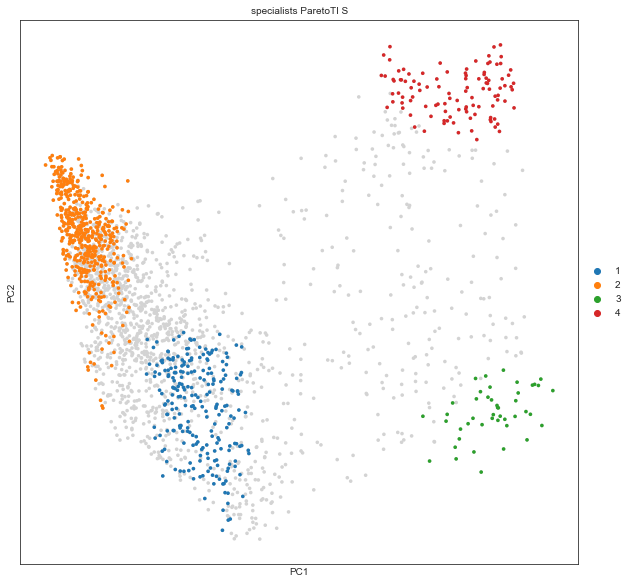

In [55]:
scv.pl.pca(X_magic, color = 'specialists_ParetoTI_S', figsize= (10,10), frameon=True, legend_loc = 'on right')


In [56]:
X_magic.obs = pd.merge(adata.obs.arc_aa_type,X_magic.obs, left_index=True, right_index=True)

In [57]:
X_magic.obs = pd.merge(adata.obs[[i for i in adata.obs if '_Score_pos' in i]],X_magic.obs, left_index=True, right_index=True)

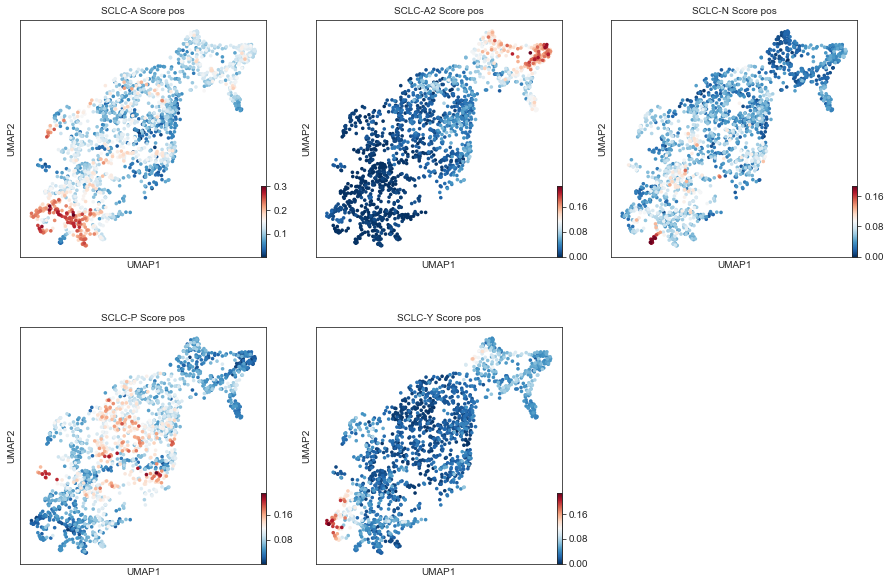

In [58]:
scv.pl.umap(X_magic, color = [i for i in adata.obs.columns if '_Score_pos' in i], legend_loc = 'on right', cmap='RdBu_r',
            figsize= (5,5), frameon=True,
            ncols = 3, smooth = True)

In [59]:
X_magic.obsm['ParetoTI_S'].columns = X_magic.obsm['ParetoTI_S'].columns.astype(str)


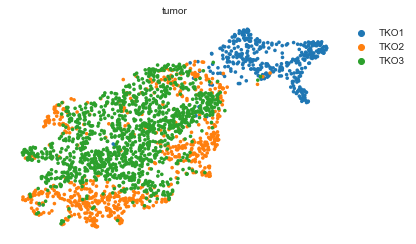

In [60]:
scv.pl.umap(X_magic, color = 'tumor')

[<AxesSubplot:title={'center':'S matrix score'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'S matrix score'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'S matrix score'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'S matrix score'}, xlabel='UMAP1', ylabel='UMAP2'>]

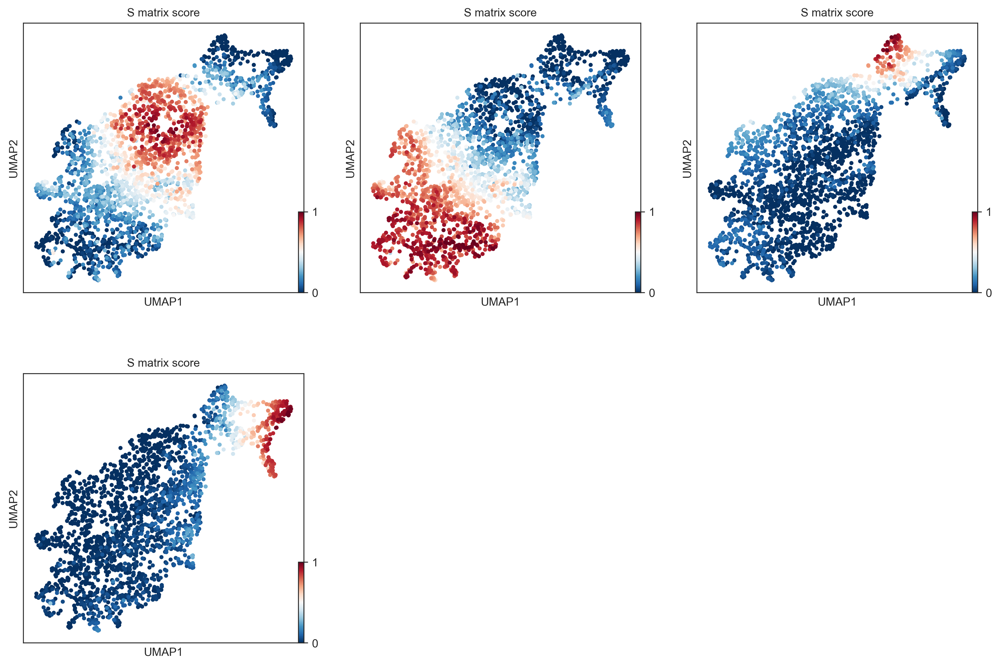

In [61]:
scv.pl.umap(X_magic, c = [X_magic.obsm['ParetoTI_S'][i] for i in X_magic.obsm['ParetoTI_S']], components='1,2', show=False, figsize= (5,5),ncols = 3, 
            title = 'S matrix score', dpi = 300,
            frameon=True, cmap = 'RdBu_r')#, save='S_matrix.png')


In [62]:
adata.write_h5ad('../../out/TKO-tumors/adata_03b.h5ad')

In [63]:
X_magic.write_h5ad('../../out/TKO-tumors/X_magic_03b.h5ad')

## Enrichment of bulk archetype signatures using Permutation enrichment test

We want to follow the same pipeline as ParTI enrichment, so we need:
1. Distances to each archetype, to determine which bin to put cells into
2. Score for each cell that we want to test enrichment of (i.e. each signature score)
    1. We may want a cut-off of significance for the scores first (or a z score, for example), so that you can't get enrichment of insignificant scores
    2. For example, P may be "enriched" in one of the archetypes, but if the P score itself isn't significant, then its enrichment doesn't mean much.
3. We want to use  a Mann-Whitney test (with FDR corrected q < 0.1). We should split the data into 10 bins and test enrichment of the clsoest bin vs. the rest of the data. The closest bin should also be the maximum.

In [3]:
X_magic = sc.read_h5ad('../../out/TKO-tumors/X_magic_03b.h5ad')

We want to make sure we sample cells from each timepoint to make sure we are sampling from the whole space (e.g. A and A2 are enriched in a lot just because A and A2 are undersampled, so the background distribution isn't biased)

saving figure to file ./figures/scvelo_bulk_score_umaps_same_scale.png


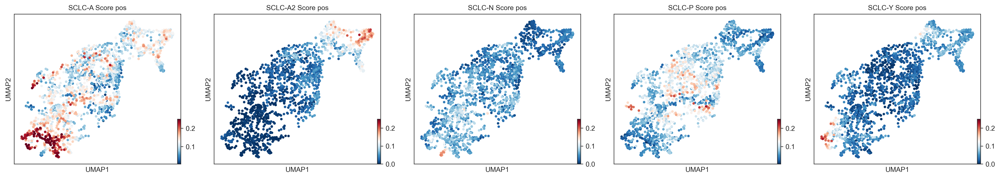

In [32]:
scv.pl.umap(X_magic, color = [i for i in X_magic.obs.columns if '_Score_pos' in i], legend_loc = 'on right', cmap='RdBu_r',
            figsize= (5,4), frameon=True, dpi = 300,vmax = .25,
            ncols = 5, smooth = True, save = 'bulk_score_umaps_same_scale.png')

saving figure to file ./figures/scvelo_bulk_score_umaps.png


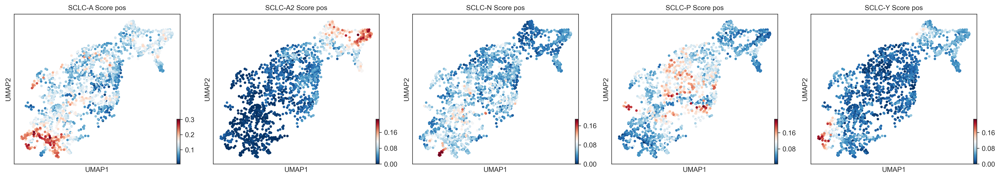

In [33]:
scv.pl.umap(X_magic, color = [i for i in X_magic.obs.columns if '_Score_pos' in i], legend_loc = 'on right', cmap='RdBu_r',
            figsize= (5,4), frameon=True, dpi = 300,
            ncols = 5, smooth = True, save = 'bulk_score_umaps.png')

saving figure to file ./figures/scvelo_umap_tumor.png


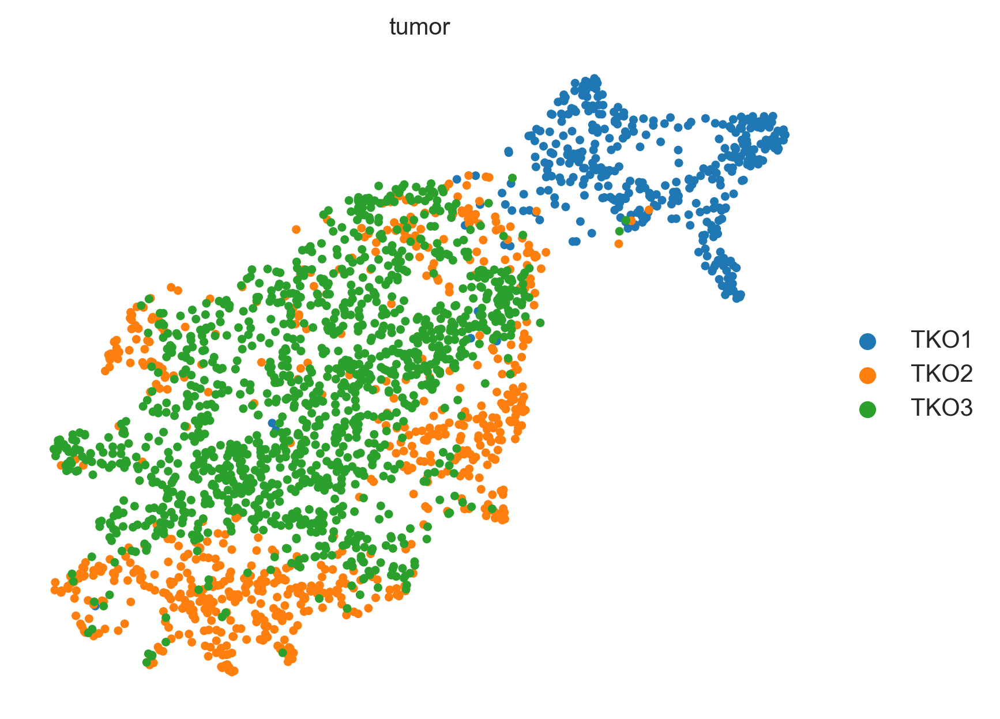

In [34]:
scv.pl.umap(X_magic, color = ['tumor'], legend_loc = 'on right', dpi = 300, save = 'umap_tumor.png', figsize = (6,5), palette = sns.color_palette(),
           )

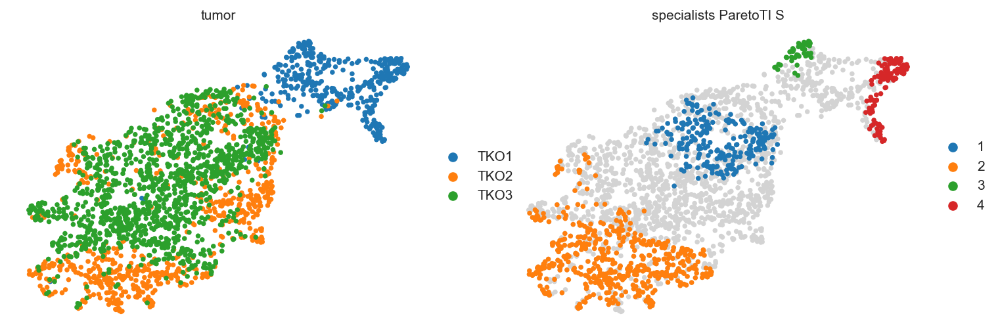

In [64]:
scv.pl.umap(X_magic, color = ['tumor','specialists_ParetoTI_S'], legend_loc = 'on right', dpi = 150)

Archetype: 1
Bulk archetype with highest average score at archetype 1: SCLC-P_Score_pos


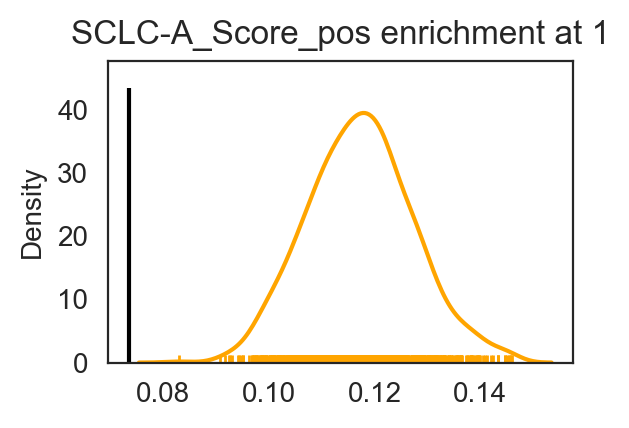

	 p-value for SCLC-A_Score_pos: 1.0
	 Fold change in mean for SCLC-A_Score_pos: 0.6388931118516393


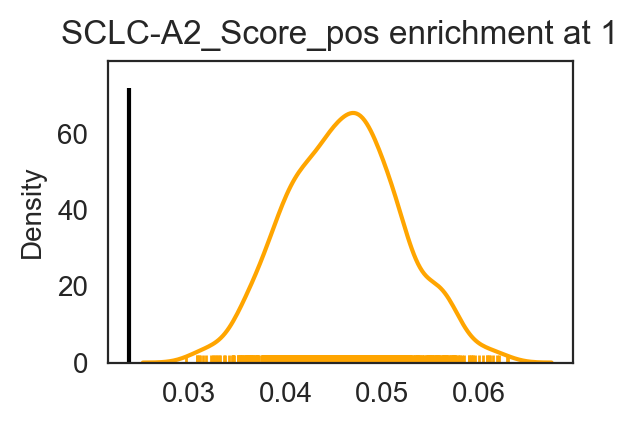

	 p-value for SCLC-A2_Score_pos: 1.0
	 Fold change in mean for SCLC-A2_Score_pos: 0.7783952207370899


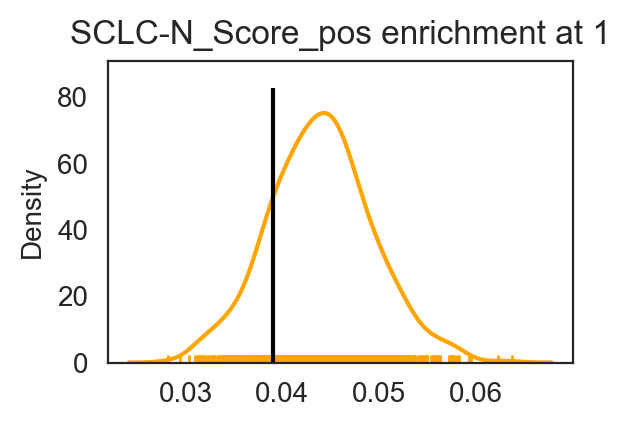

	 p-value for SCLC-N_Score_pos: 0.825
	 Fold change in mean for SCLC-N_Score_pos: 0.8091109638224847


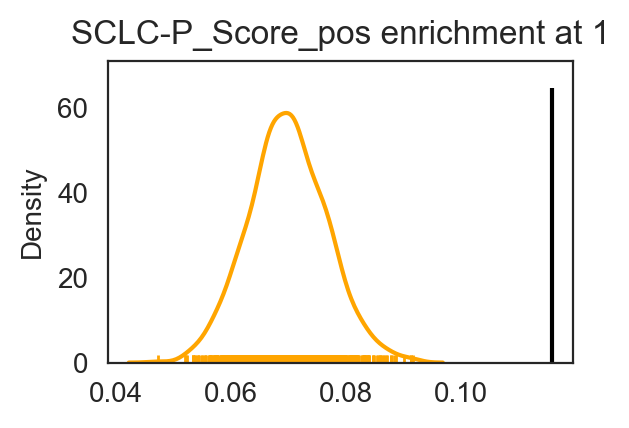

	 p-value for SCLC-P_Score_pos: 0.0
	 Fold change in mean for SCLC-P_Score_pos: 1.4825560662503998


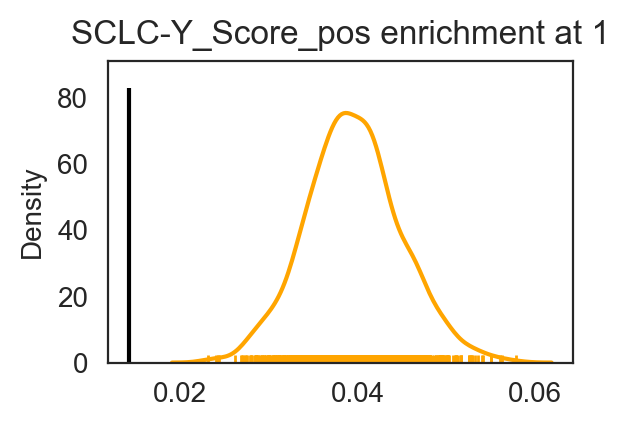

	 p-value for SCLC-Y_Score_pos: 1.0
	 Fold change in mean for SCLC-Y_Score_pos: 0.40764316756655017
Archetype: 2
Bulk archetype with highest average score at archetype 2: SCLC-A_Score_pos


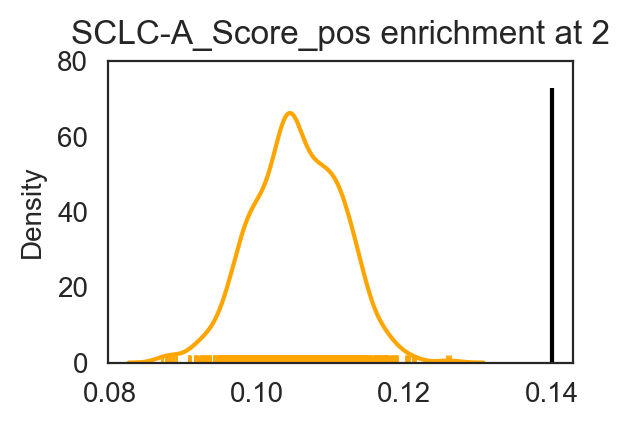

	 p-value for SCLC-A_Score_pos: 0.0
	 Fold change in mean for SCLC-A_Score_pos: 1.3580587318653619


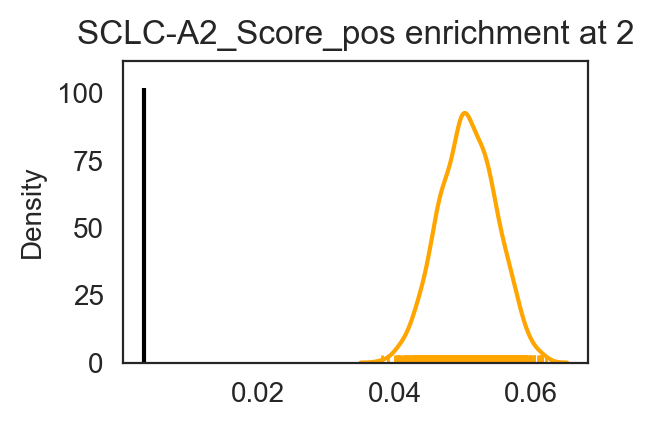

	 p-value for SCLC-A2_Score_pos: 1.0
	 Fold change in mean for SCLC-A2_Score_pos: 0.08816958303134621


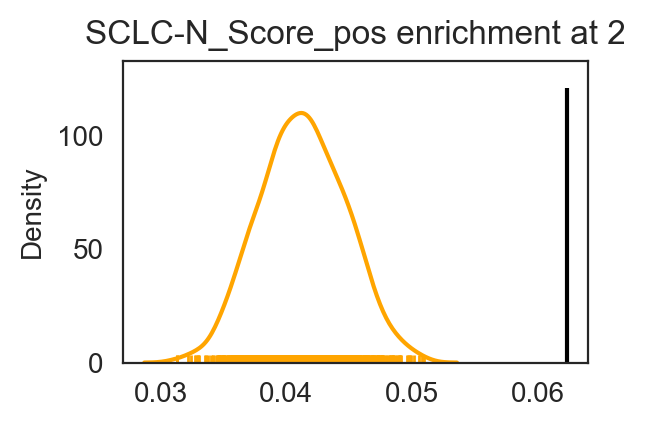

	 p-value for SCLC-N_Score_pos: 0.0
	 Fold change in mean for SCLC-N_Score_pos: 1.4433098166852947


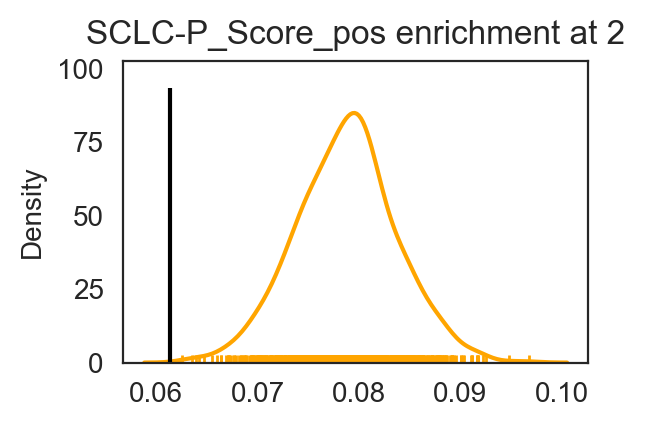

	 p-value for SCLC-P_Score_pos: 1.0
	 Fold change in mean for SCLC-P_Score_pos: 0.7015590646206478


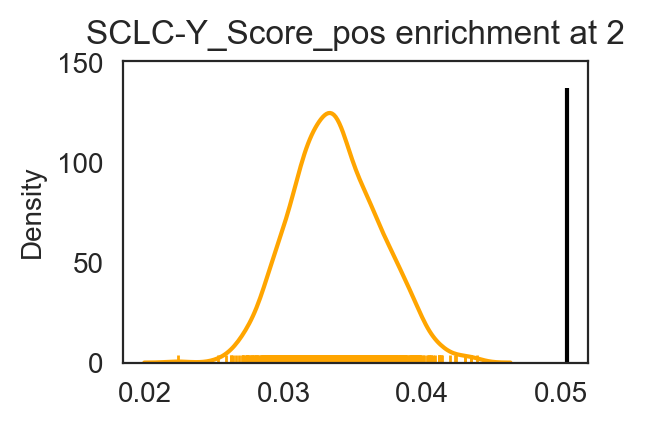

	 p-value for SCLC-Y_Score_pos: 0.0
	 Fold change in mean for SCLC-Y_Score_pos: 1.8009038761746887
Archetype: 3
Bulk archetype with highest average score at archetype 3: SCLC-A_Score_pos


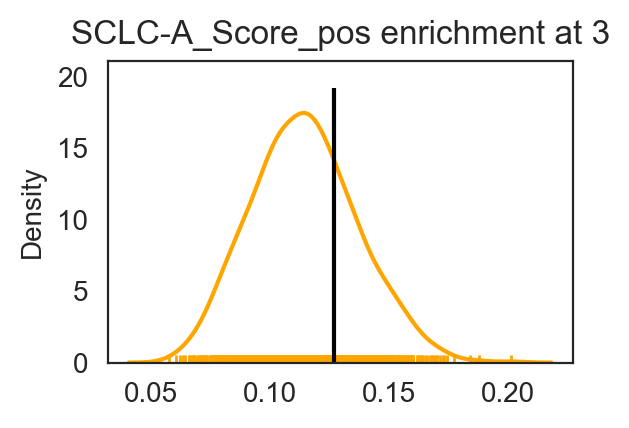

	 p-value for SCLC-A_Score_pos: 0.28
	 Fold change in mean for SCLC-A_Score_pos: 1.1435697230445145


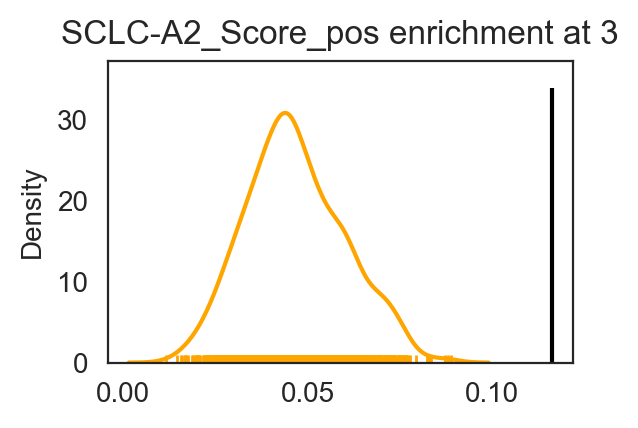

	 p-value for SCLC-A2_Score_pos: 0.0
	 Fold change in mean for SCLC-A2_Score_pos: 4.119040702481364


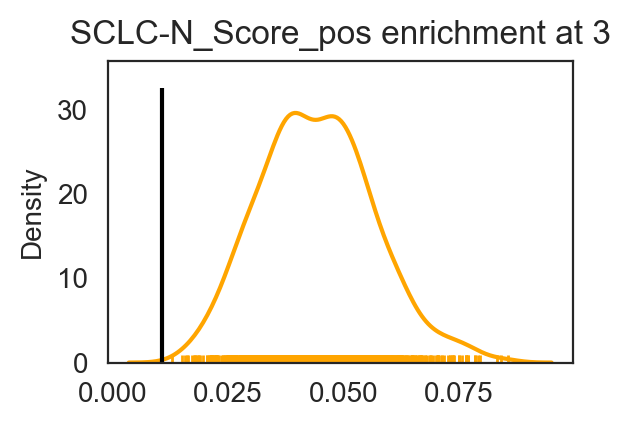

	 p-value for SCLC-N_Score_pos: 1.0
	 Fold change in mean for SCLC-N_Score_pos: 0.21979693647174528


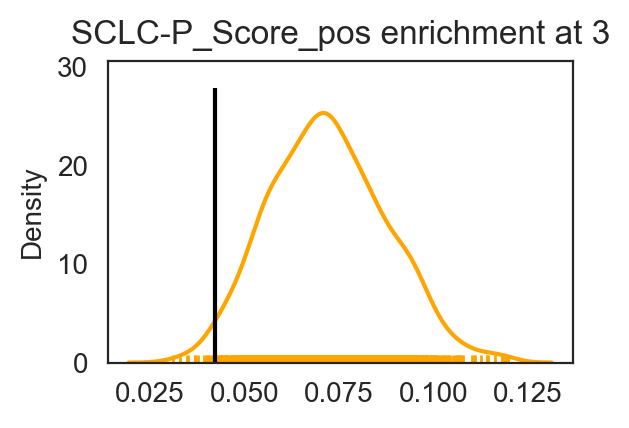

	 p-value for SCLC-P_Score_pos: 0.984
	 Fold change in mean for SCLC-P_Score_pos: 0.5107915755340753


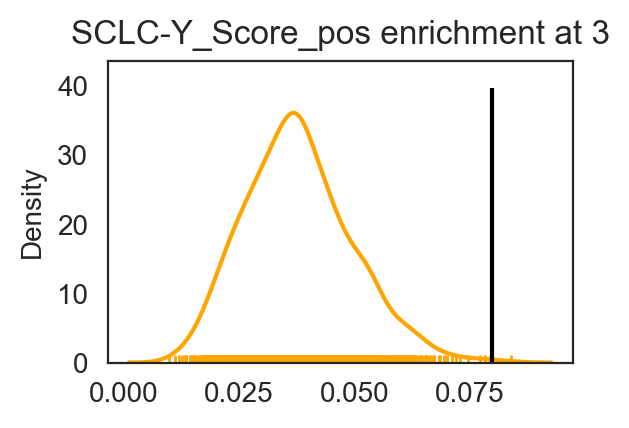

	 p-value for SCLC-Y_Score_pos: 0.0009999999999998899
	 Fold change in mean for SCLC-Y_Score_pos: 2.4964848498269565
Archetype: 4
Bulk archetype with highest average score at archetype 4: SCLC-A2_Score_pos


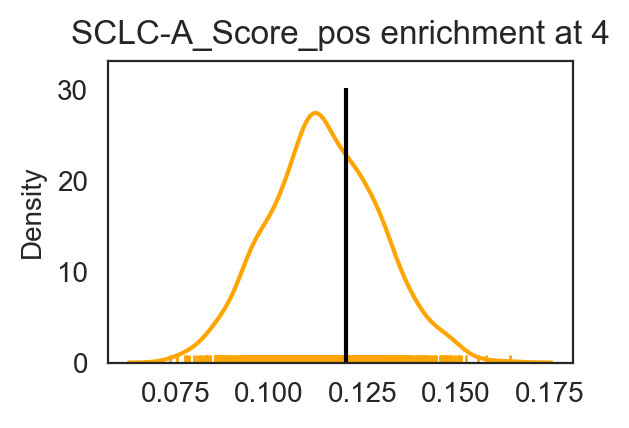

	 p-value for SCLC-A_Score_pos: 0.3490000000000001
	 Fold change in mean for SCLC-A_Score_pos: 1.089519915873958


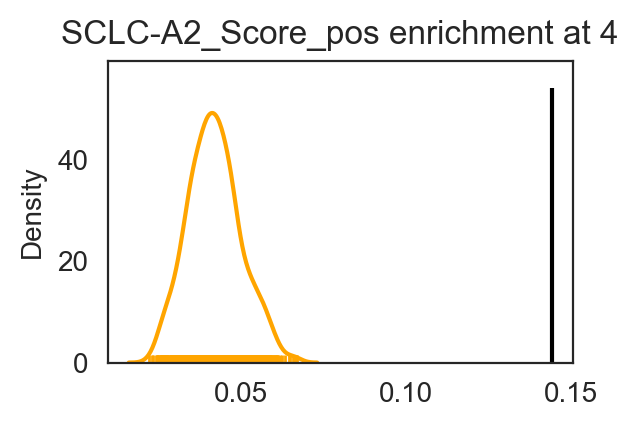

	 p-value for SCLC-A2_Score_pos: 0.0
	 Fold change in mean for SCLC-A2_Score_pos: 5.9009727187473535


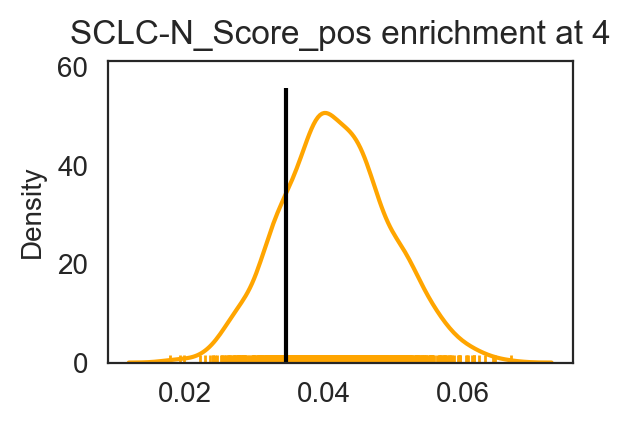

	 p-value for SCLC-N_Score_pos: 0.8180000000000001
	 Fold change in mean for SCLC-N_Score_pos: 0.7220948795831883


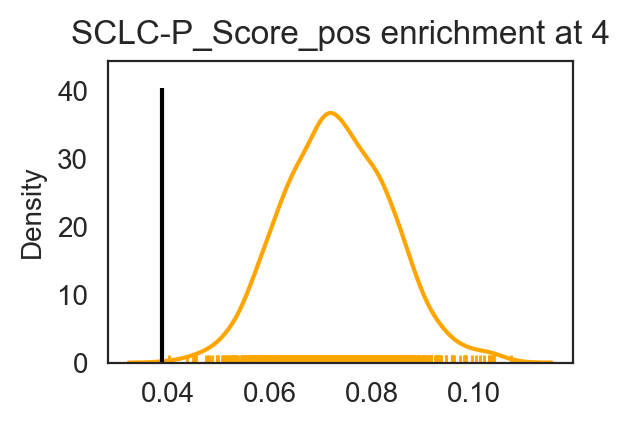

	 p-value for SCLC-P_Score_pos: 1.0
	 Fold change in mean for SCLC-P_Score_pos: 0.4635255123264668


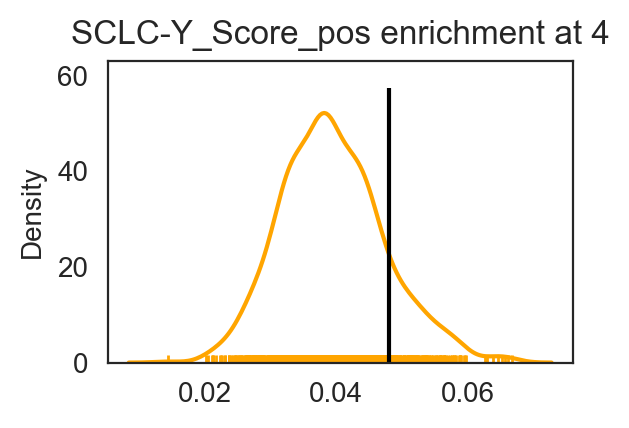

	 p-value for SCLC-Y_Score_pos: 0.133
	 Fold change in mean for SCLC-Y_Score_pos: 1.4941602682185235


In [68]:
score = X_magic.obs[[i for i in X_magic.obs if '_Score_pos' in i]]
score = score.fillna(0)
p_values_mean_SE = mb.ar.permutation_enrichment_test(X_magic, score, plot = True, stat = 'mean', verbose = True, sample_equally='tumor')

In [66]:
#now implemented in permutation_enrichment_test
from statsmodels.stats import multitest
p_values_mean_SE['id'] = p_values_mean_SE.index
p_values_mean_SE_melt = p_values_mean_SE.melt(id_vars='id',value_vars=p_values_mean_SE.columns)
p_values_mean_SE_melt['corr_p'] = multitest.multipletests(p_values_mean_SE_melt['value'], method = 'holm')[1]

In [67]:
p_values_mean_SE_melt.pivot(index='id', columns='variable', values='corr_p')

variable,SCLC-A2_Score_pos,SCLC-A_Score_pos,SCLC-N_Score_pos,SCLC-P_Score_pos,SCLC-Y_Score_pos
id,,,,,
1,1,1,1,0.0,1
2,1,0.0,0.0,1,0.0
3,0.0,1,1,1,0.042
4,0.0,1,1,1,1


In [69]:
 X_magic.obs['ParetoTI_specialists'] = [{'1':'P',
 '2':'A',
 '3':'A2-1',
 '4':'A2-2',
 np.nan: np.nan}[i] for i in X_magic.obs.specialists_ParetoTI_S]
    

In [71]:
X_magic.uns['ParetoTI_specialists_colors'] = ['#F8766D','#E18A00','#BE9C00','#8CAB00']



saving figure to file ./figures/scvelo_umap_specialists.png


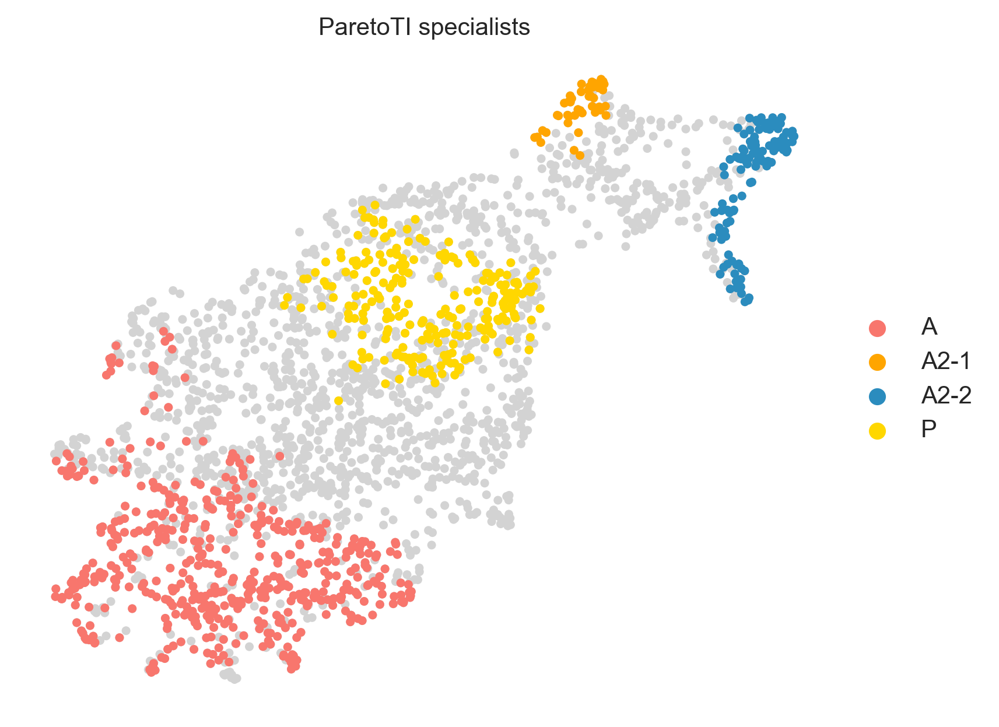

In [72]:
scv.pl.umap(X_magic, color = ['ParetoTI_specialists'], palette=['#F8766D','orange','#2b8cbe','gold'],legend_loc = 'on right', 
            figsize = (6,5),
           save = 'umap_specialists.png', dpi = 300)



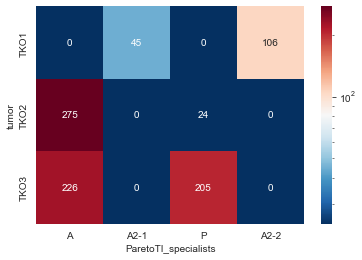

In [76]:
from matplotlib.colors import LogNorm, Normalize

sns.heatmap(pd.crosstab(X_magic.obs.tumor, X_magic.obs.ParetoTI_specialists)[['A','A2-1','P','A2-2']], annot=True,
            norm=LogNorm(clip = True), fmt = 'd', cmap = 'RdBu_r')
plt.savefig('./figures/heatmap_ParetoTI-specialists_tumors.pdf')


In [77]:
X_magic.write_h5ad('../../out/TKO-tumors/X_magic_03b.h5ad')


In [78]:
X_magic.obs['subtype'] =X_magic.obs.specialists_ParetoTI_S

X_magic.obs.subtype = [str(i) for i in X_magic.obs.subtype]

new = []
for i in X_magic.obs.subtype:
    if i == 'nan':
        new.append("Generalist")
    else:
        new.append("Archetype "+str(i))

X_magic.obs.subtype = new

In [79]:
X_magic.obs['subtype_labeled'] =X_magic.obs.ParetoTI_specialists

X_magic.obs.subtype_labeled = [str(i) for i in X_magic.obs.subtype_labeled]

new = []
for i in X_magic.obs.subtype_labeled:
    if i == 'nan':
        new.append("Generalist")
    else:
        new.append(str(i))

X_magic.obs.subtype_labeled = new

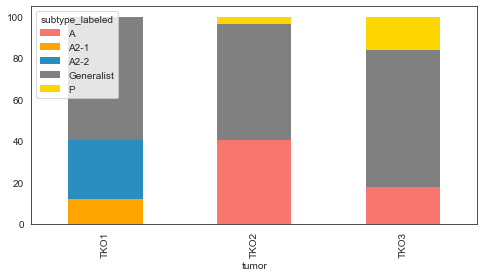

In [82]:
# cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
# color_dict = {'Archetype 3': cp[4], 'Archetype 5': cp[0], 'Archetype 4': cp[1], 'Archetype 2': cp[2], 'Archetype 1': cp[3],
#               'Generalist': 'darkgrey', 'Unclassified': 'lightgrey'}
mb.pl.subtype_bar(X_magic,groupby='tumor', fname = 'TKO', pheno_name="subtype_labeled", custom_palette=['#F8766D','orange','#2b8cbe','grey','gold','#2ca25f'])

saving figure to file ./figures/scvelo__phase.png


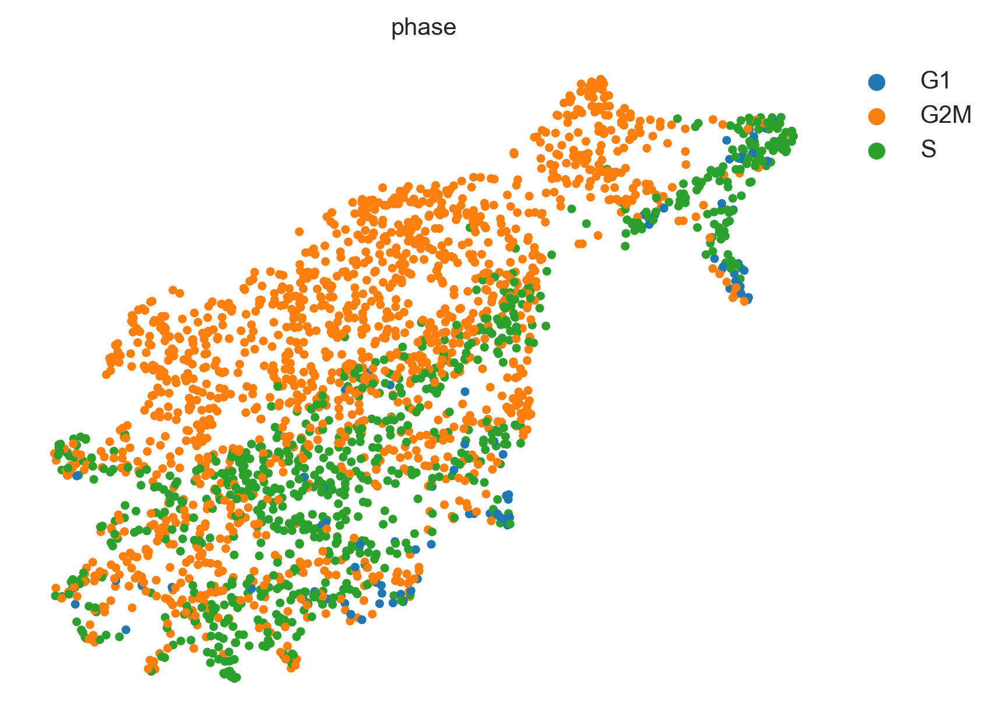

In [83]:
scv.pl.umap(X_magic, color = 'phase', save='_phase.png', dpi = 300, figsize = (6,5))